## Import the libraries

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import pandas as pd

import os

import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

from sklearn.model_selection import KFold
from sklearn.metrics import ConfusionMatrixDisplay

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score


In [2]:
train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test.csv')

print("The shape of the train dataset is {}.\n\n".format(train_df.shape))
print("The shape of the test dataset is {}.\n\n".format(test_df.shape))

The shape of the train dataset is (10834, 18).


The shape of the test dataset is (2709, 17).




In [3]:
train_df.groupby(by="y").describe().T

y                      BARBUNYA       BOMBAY         CALI     DERMASON  \
ID           count  1057.000000   418.000000  1304.000000  2837.000000   
             mean   5576.211921  5152.277512  5441.500000  5323.486077   
             std    3061.528909  3150.986371  3127.979057  3115.017214   
             min      10.000000    18.000000    11.000000     2.000000   
             25%    2982.000000  2421.000000  2751.750000  2601.000000   
...                         ...          ...          ...          ...   
ShapeFactor4 min       0.976512     0.968842     0.970210     0.976325   
             25%       0.994548     0.989596     0.988232     0.996283   
             50%       0.996347     0.992476     0.991269     0.997376   
             75%       0.997457     0.994890     0.993781     0.998135   
             max       0.999351     0.999148     0.999368     0.999709   

y                         HOROZ        SEKER         SIRA  
ID           count  1488.000000  1621.000000  2109.000000  
             mean   5470.712366  5502.337446  5394.261735  
             std    3101.804385  3187.640236  3141.087629  
             min       0.000000     1.000000     4.000000  
             25%    2840.500000  2712.000000  2662.000000  
...                         ...          ...          ...  
ShapeFactor4 min       0.955032     0.947687     0.971228  
             25%       0.990504     0.998069     0.994269  
             50%       0.993723     0.998633     0.996024  
             75%       0.995748     0.999018     0.997197  
             max       0.999016     0.999733     0.999515  

[136 rows x 7 columns]

In [4]:
# Transform and inv transform function

def transform_to_num(data):
    for i in range(len(data)):
        if data[i] == "BARBUNYA":
            data[i] = 1
        elif data[i] == "BOMBAY":
            data[i] = 2
        elif data[i] == "CALI":
            data[i] = 3
        elif data[i] == "DERMASON":
            data[i] = 4
        elif data[i] == "HOROZ":
            data[i] = 5
        elif data[i] == "SEKER":
            data[i] = 6
        elif data[i] == "SIRA":
            data[i] = 7
    return (data)

def transform_to_cat(data):
    for i in range(len(data)):
        if data[i] == 1:
            data[i] = "BARBUNYA"
        elif data[i] == 2:
            data[i] = "BOMBAY"
        elif data[i] == 3:
            data[i] = "CALI"
        elif data[i] == 4:
            data[i] = "DERMASON"
        elif data[i] == 5:
            data[i] = "HOROZ"
        elif data[i] == 6:
            data[i] = "SEKER"
        elif data[i] == 7:
            data[i] = "SIRA"
    return (data)
            

## Exploratory Data Analysis

In [5]:
train_df.describe().T  

,count,mean,std,min,25%,50%,75%,max
ID,10834.0,5416.500000,3127.650742,0.000000,2708.250000,5416.500000,8124.750000,10833.000000
Area,10834.0,53095.675189,29542.542580,20420.000000,36343.500000,44645.000000,61295.000000,254616.000000
Perimeter,10834.0,855.274892,214.991122,524.932000,703.601250,793.739500,975.517500,1985.370000
MajorAxisLength,10834.0,320.036169,85.961630,183.601165,253.501071,296.377365,376.068399,738.860153
MinorAxisLength,10834.0,202.410342,45.113965,129.576207,175.927024,192.525040,217.315195,450.926187
AspectRation,10834.0,1.581294,0.244314,1.024868,1.432985,1.550761,1.703029,2.388873
Eccentricity,10834.0,0.750588,0.091481,0.218951,0.716250,0.764314,0.809450,0.908167
ConvexArea,10834.0,53816.205926,29999.710739,20684.000000,36731.250000,45148.000000,62251.500000,263261.000000
EquivDiameter,10834.0,253.123583,59.433080,161.243764,215.113880,238.419335,279.362162,569.374358
Extent,10834.0,0.749937,0.048949,0.555315,0.718778,0.760141,0.786871,0.866195


In [6]:
colors = ['#550000', '#BB0000', '#FF0000', '#EEEE00', '#00FF00', '#00BB00', '#005500']
display(train_df["y"].value_counts(),
        px.histogram(data_frame=train_df,template='plotly_dark',x="y",color="y",color_discrete_sequence= colors));

DERMASON    2837
SIRA        2109
SEKER       1621
HOROZ       1488
CALI        1304
BARBUNYA    1057
BOMBAY       418
Name: y, dtype: int64

In [7]:
px.scatter(train_df,hover_name="y",template='plotly_dark',
           x="MajorAxisLength",y="MinorAxisLength",color="y",symbol="y",color_discrete_sequence= colors)

In [8]:

fig1 = px.box(data_frame=train_df,template='plotly_dark',
       x="y",y=["EquivDiameter"],color="y",width=700,height=350,title="EquivDiameter")
fig2 = px.box(data_frame=train_df,template='plotly_dark',
       x="y",y=["ConvexArea"],color="y",width=700,height=350,title="ConvexArea")
fig1.show()
fig2.show()

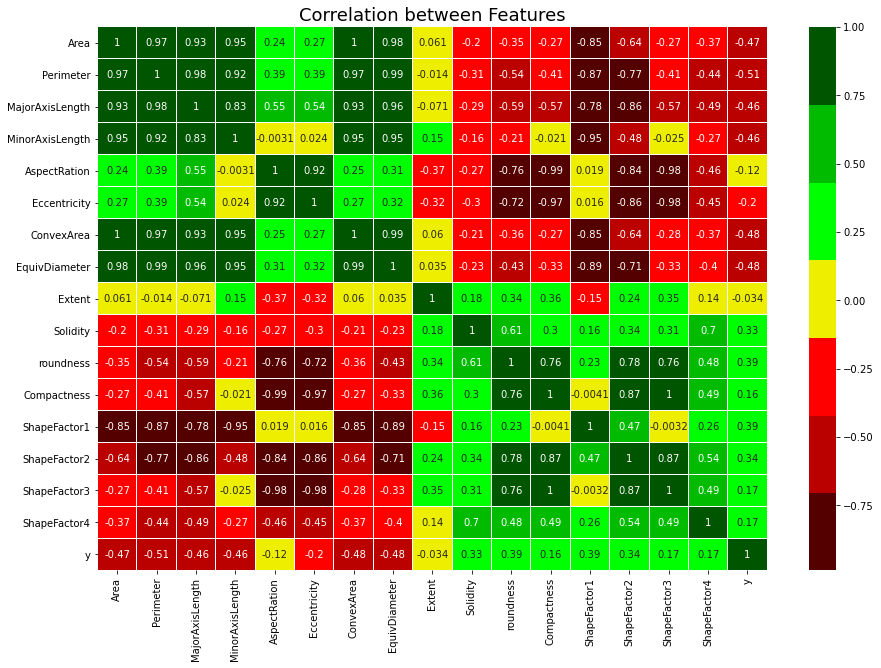

In [9]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
corrl = train_df.copy()
corrl['y'] = le.fit_transform(corrl.y)

corr_martix = corrl.drop('ID',axis=1).corr()
plt.subplots(figsize=(15,10))
plt.title('Correlation between Features', size=18)
sns.heatmap(corr_martix,linewidths=0.01,cmap=colors , annot=True)
plt.show()

# Others

In [10]:
from sklearn.preprocessing import LabelEncoder

# le = LabelEncoder()
# train_df['y'] = le.fit_transform(train_df.y)
train_df['y'] = transform_to_num(train_df["y"])
#==============================================================
df = train_df.copy(deep=True) # Make a copy of original data, just in case

# Create new dataframe for each type

types = df['y'].unique()
d = {type: df[df['y'] == type] for type in types}
#==============================================================
# Set the quantile

low = .25
high = .75

bounds = {}
for type in types:
    filt_df = d[type].loc[:, d[type].columns != 'y'] # Remove 'Type' Column
    quant_df = filt_df.quantile([low, high])
    IQR = quant_df.iloc[1,:]-  quant_df.iloc[0,:]
    quant_df.iloc[0,:] = quant_df.iloc[0,:] - 1.5*IQR
    quant_df.iloc[1,:] = quant_df.iloc[1,:] + 1.5*IQR
    bounds[type] = quant_df
#==============================================================
# Define our new dataset by removing the outliers 

filt_df = d[1].loc[:, d[1].columns != 'y'] # Remove 'Type' Column
filt_df = filt_df.apply(lambda x: x[(x>bounds[1].loc[low,x.name]) & (x < bounds[1].loc[high,x.name])], axis=0)
filt_df = pd.concat([filt_df,d[1].loc[:,'y']], axis=1)

# filt_df
#==============================================================
# Let's remove the outliers from the dataset 
df_new = {}

for type in types:
    filt_df = d[type].loc[:, d[type].columns != 'y'] # Remove 'Type' Column
    filt_df = filt_df.apply(lambda x: x[(x>bounds[type].loc[low,x.name]) & (x < bounds[type].loc[high,x.name])], axis=0)
    df_new[type] = pd.concat([filt_df,d[type].loc[:,'y']], axis=1)


glassdata_new = result = pd.concat(df_new)
# glassdata_new
#==============================================================


cols = glassdata_new.columns.drop('ID').drop('y')


for col in cols:
  
  glassdata_new[col] = glassdata_new[col].fillna(glassdata_new.groupby('y')[col].transform('mean'))

#=========================================================================

<ipython-input-4-b54de7dba4f7>:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-4-b54de7dba4f7>:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-4-b54de7dba4f7>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-4-b54de7dba4f7>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pand

In [11]:
glassdata_new.head(3)

ID     Area  Perimeter  MajorAxisLength  MinorAxisLength  AspectRation  \
5 0    0  58238.0    971.303       397.202654       186.945510      2.124697   
  6    6  45817.0    862.123       333.458920       175.910473      1.895617   
  15  15  63899.0    984.916       398.584836       205.390490      1.940620   

      Eccentricity  ConvexArea  EquivDiameter    Extent  Solidity  roundness  \
5 0       0.882317     58977.0     272.306674  0.604756  0.987470   0.775723   
  6       0.849535     46654.0     241.528500  0.757932  0.982059   0.774637   
  15      0.857010     64499.0     285.234524  0.828351  0.990698   0.827762   

      Compactness  ShapeFactor1  ShapeFactor2  ShapeFactor3  ShapeFactor4  y  
5 0      0.685561      0.006820      0.000929      0.469994      0.998595  5  
  6      0.724313      0.007278      0.001236      0.524629      0.994495  5  
  15     0.715618      0.006238      0.001009      0.512109      0.993809  5

# Training oversampling

In [12]:
import imblearn
from imblearn.over_sampling import SMOTE 
from collections import Counter
# transform the dataset
oversample = SMOTE(random_state=42)
numerical_cat = glassdata_new.drop("ID",axis=1).copy()

In [13]:
numerical_cat['y'] = numerical_cat['y'].astype('category')
X, y = oversample.fit_resample(numerical_cat.drop("y",axis=1), numerical_cat['y'])

resampled_df = X.merge(y, left_index=True, right_index=True)

resampled_df['y'] = resampled_df['y'].astype('int')
resampled_df["y"] = transform_to_cat(resampled_df["y"])

<ipython-input-4-b54de7dba4f7>:32: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\User\anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [14]:
px.histogram(data_frame=resampled_df,template='plotly_dark',x="y",color="y",color_discrete_sequence= colors)

In [15]:
px.scatter(resampled_df,hover_name="y",template='plotly_dark',
           x="MajorAxisLength",y="MinorAxisLength",color="y",symbol="y",color_discrete_sequence= colors)

# drop columns

In [16]:
train_df.columns

Index(['ID', 'Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4', 'y'],
      dtype='object')

In [17]:
glassdata_new = train_df.drop(['MajorAxisLength', 'MinorAxisLength','Perimeter','ConvexArea', 'EquivDiameter',],axis=1)
test_df = test_df.drop(['MajorAxisLength', 'MinorAxisLength','Perimeter','ConvexArea', 'EquivDiameter',],axis=1)
resampled_df = resampled_df.drop(['MajorAxisLength', 'MinorAxisLength','Perimeter','ConvexArea', 'EquivDiameter',],axis=1)

## A) Data preprocessing and Splitting for resampled_df

**Standardization**

In [18]:
# normalize the data
from sklearn.preprocessing import StandardScaler
stand = StandardScaler()
standard_df = np.copy(resampled_df.drop(columns=['y'])) ### use resampled_df -> drop y or train_df -> drop y and ID
standard_df
stand.fit(standard_df)
standard_df = stand.transform(standard_df)               ### make changes down too

**splitting**

In [19]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(standard_df,resampled_df["y"], test_size=0.2,random_state=104)
print(np.shape(X_train),np.shape(X_test),np.shape(y_train),np.shape(y_test))

(15887, 11) (3972, 11) (15887,) (3972,)


# Lazy predictor

In [20]:
# ### importing lazypredict library
# import lazypredict
# ### importing LazyClassifier for classification problem
# from lazypredict.Supervised import LazyClassifier

In [21]:
# clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric = None)
# ### fitting data in LazyClassifier
# models,predictions = clf.fit(X_train, X_test, y_train, y_test)
# ### lets check which model did better on Breast Cancer Dataset
# print(models)

## Model Training

**1- MLPClassifier**

In [22]:
from sklearn.neural_network import MLPClassifier

# Create an instance of the classifier
mlp = MLPClassifier(learning_rate='adaptive',max_iter=200,random_state=38,alpha=0.0001,learning_rate_init=0.001)

# Train the classifier
mlp.fit(X_train, y_train)
prediction_mlp = mlp.predict(X_test)

C:\Users\User\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



In [23]:
f1_score(prediction_mlp, y_test,average=None).mean() 

0.9730023371561173

**2- SVM**

In [24]:
from sklearn.svm import SVC
svm_clf = SVC(degree=3,gamma='auto')
svm_clf.fit(X = X_train,y= y_train)
prediction_svc = svm_clf.predict(X_test)

In [25]:
f1_score(prediction_svc, y_test,average=None).mean() 

0.9712278213915132

**3- XGB**

In [26]:
from xgboost import XGBClassifier

xgb = XGBClassifier()
xgb.fit(X = X_train,y= y_train)
prediction_xgb = xgb.predict(X_test)

In [27]:
f1_score(prediction_xgb, y_test,average=None).mean()

0.9732641851009164

**4- RFC**

In [28]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(n_estimators=31,max_depth=27,n_jobs=-1,random_state=99)
rfc.fit(X = X_train,y= y_train)
prediction_rfc = rfc.predict(X_test)

In [29]:
f1_score(prediction_rfc, y_test,average=None).mean()

0.9699456735158128

**5- LogisticRegression**

In [30]:
from sklearn.linear_model import LogisticRegression

LR = LogisticRegression(max_iter=41,multi_class='multinomial',n_jobs=-1)
LR.fit(X = X_train,y= y_train)
prediction_LR = LR.predict(X_test)

In [31]:
f1_score(prediction_LR, y_test,average=None).mean()

0.9686529103199922

**6- LGBM**

In [32]:
import lightgbm as lgb

lgbm = lgb.LGBMClassifier(num_leaves = 88 , max_depth  = 11 , learning_rate  = 0.244 , n_estimators = 46,random_state=42)
lgbm.fit(X_train, y_train)
prediction_lgb = lgbm.predict(X_test)

In [33]:
 f1_score(prediction_lgb, y_test,average=None).mean()

0.973768668162868

****************************************************************

**Voting Classifier for resampled_df**

In [34]:
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import RandomForestClassifier
import lightgbm as lgb
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier

In [35]:
# clf1 = LogisticRegression(max_iter=41,multi_class='multinomial',n_jobs=-1)
clf2 = RandomForestClassifier(n_estimators=31,max_depth=27,n_jobs=-1,random_state=99)
clf3 = lgb.LGBMClassifier(num_leaves = 88 , max_depth  = 11 , learning_rate  = 0.244 , n_estimators = 46,random_state=42)
clf4 = MLPClassifier(learning_rate='adaptive',max_iter=92,random_state=38,alpha=0.0001,learning_rate_init=0.001)
clf5 = SVC(gamma='auto')
clf6 = XGBClassifier()

eclf1 = VotingClassifier(estimators=[ ('rf', clf2), ('lgbm', clf3),
                                     ('MLP', clf4),('SVC', clf5),('XGB', clf6)],weights=[1,1,1,1,1],flatten_transform=True, voting='hard')

eclf1 = eclf1.fit(X = X_train,y= y_train)

C:\Users\User\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (92) reached and the optimization hasn't converged yet.



In [36]:
prediction_rfc = eclf1.predict(X_test)
print(f1_score(prediction_rfc, y_test,average="micro"))

0.973313192346425
